# CS448 - Lab 2: Filter Design and Usage

For this lab you will learn how to design some simple filters and how to apply them to solve some common audio problems. Python’s scipy.signal package has an extensive set of commands to help you design filters (firwin, firwin2, butter, cheby1, cheby2,  ellip, …), so there is no shortage of options.

## Part 1: When to use what 

In [7]:
import soundfile as sf
import numpy as np
#in order to plot the spectrogram, I load the code in lab 1 here
import matplotlib.pyplot as plt
def stft( input_sound, dft_size, hop_size, window):
    #add some zeros at the end
    num_of_hop = (len(input_sound)-dft_size)//hop_size +1
    num_zeros = num_of_hop*hop_size + dft_size - len(input_sound)
    zeros_array = np.zeros(num_zeros)
    sound = np.concatenate((input_sound,zeros_array))
    #segment the input into frames
    frames = []
    for i in range(0,(len(sound)-dft_size+1),hop_size):
        frame = sound[i:(i+dft_size)]
        spectrum_of_frame = np.fft.rfft(frame*window)
        frames.append(spectrum_of_frame)

    # Return a complex-valued spectrogram (frequencies x time)
    return frames

#plot function for time-frequency illustration
def plot_time_frequency(time_length, sample_rate,DFT,dft_size,title):
    time = np.linspace(0,time_length,len(DFT[0]))
    frequency = np.fft.rfftfreq(dft_size,1/sample_rate)#np.linspace(0,sample_rate/2,1)
    # print(len(time),len(frequency))
    # print(len(DFT),len(DFT[0]))
    plt.pcolormesh(time,frequency,DFT)
    plt.xlabel("Time(sec)")
    plt.ylabel("Frequency(Hz)")
    plt.title("{}".format(title))
def plot_specgram(sound, sample_rate,title):
    plt.specgram(sound,Fs=sample_rate)
    plt.xlabel("Time(sec)")
    plt.ylabel("Frequency(Hz)")
    plt.title("{}".format(title))
    
#get log of each value of a matrix, return a matrix
def get_log(matrix):
    matrix_log = np.zeros((len(matrix),len(matrix[0])))
    for i in range(len(matrix)):
        for j in range(len(matrix[0])):
            if matrix[i][j] != 0:
                matrix_log[i][j] = np.log(abs(matrix[i][j]))
            else:
                matrix_log[i][j] = -100
    return matrix_log
# Make a sound player function that plays array "x" with a sample rate "rate", and labels it with "label"
def play_sound( x, rate=8000, label=''):
    from IPython.display import display, Audio, HTML
    if label == '':
        display( Audio( x, rate=rate))
    else:
        display( HTML( 
        '<style> table, th, td {border: 0px; }</style> <table><tr><td>' + label + 
        '</td><td>' + Audio( x, rate=rate)._repr_html_()[3:] + '</td></tr></table>'
        ))

There will be four cases to this part, each requiring a different type of filter to address a problem in a recording.  The input recordings are:

- ```case1.wav``` [https://drive.google.com/uc?export=download&id=1eTsDiXqqLQv3murPz25O54E89i3DL__d ] : A noise-corrupted speech signal. We want to eliminate the noise.
- ```case2.wav``` [https://drive.google.com/uc?export=download&id=1egd22CxPUe6sINIi0FPTbMfG4S_In2hT ] : Same as above, different type of noise. We want to remove the noise again.
- ```case3.wav``` [https://drive.google.com/uc?export=download&id=1eF-VOVWoT1rh1wAC06WT1ANusMKyDYSn ] : Bird songs during a thunderstorm. As a world renowned ornithologist you need to have a cleaner recording of the bird songs for further analysis.
- ```case4.wav``` [https://drive.google.com/uc?export=download&id=1eeizGhrBICf6pW5OXcbq7ChF4m2N6yIk ]: The signal that we require to extract here is a Morse code which is buried in environmental noise. Design a filter to bring out the beeps.

For each case do the following:
- Plot the spectrogram of the given sound and identify the problem
- Describe what kind of filter will address this problem and why
- Design an FIR filter using ```scipy.signal.firwin()``` and/or ```scipy.signal.firwin2()```
- Design an FIR filter using the formulas in my slides (i.e. do not use ```scipy.signal```)
- Design an IIR Butterworth filter using ```scipy.signal```'s routines
- Show a plot comparing the response of all the filters (hint: ```scipy.signal.freqz```)
- Plot spectrograms of the filtered recordings and compare with the input to show that it fixed the problem
- Play the filtered sounds so that we can hear how well it works

Make some observations on how the results differ between an FIR and IIR filter and try to find the best possible filter size/type/parameters to produce the best result. Show results under various parameters (e.g. filter length) and make some plots that demonstrate the effects of these parameters. Most importantly, try to get a sense of how these design choices impact audible quality. Being able to listen at a sound and identify what’s wrong and how to fix it is a big part of audio processing.

Hint: To apply an FIR filter you can use ```scipy.signal.convolve```, to apply an IIR filter (or an FIR) you can use ```scipy,signal.lfilter```.


dft_size: 256, hop_size: 64
It can be seen from the spectrogram that some high frequence exits, so I'll use a low pass filter
The cutoff frequency is around 6100Hz telling from the spectrogram


Case1: FIR filter using scipy


Case1: FIR filter using formula


Case1: IIR Butterworth filter


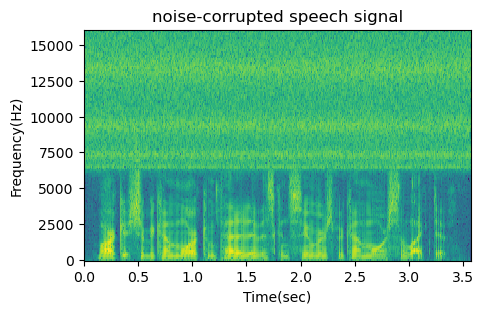

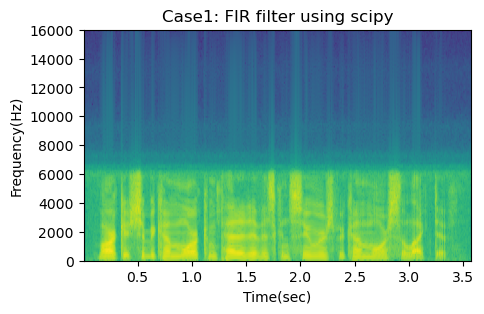

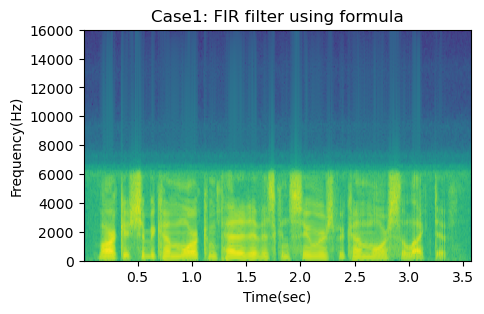

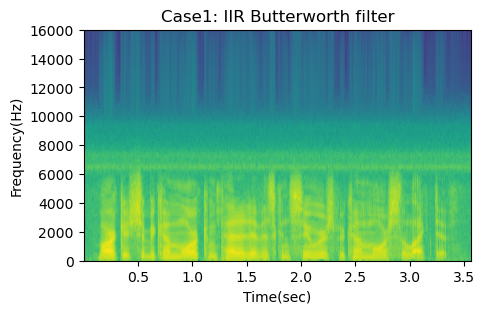

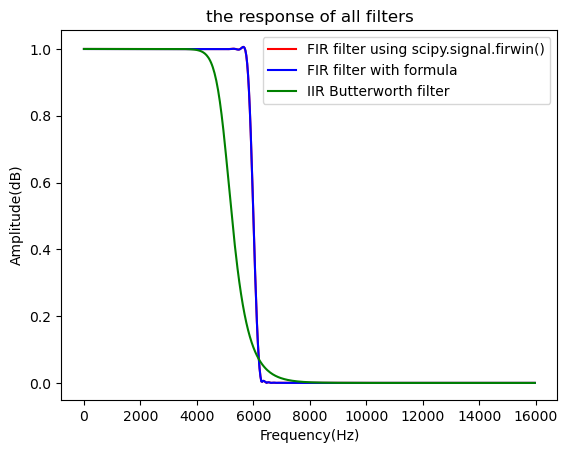

<Figure size 640x480 with 0 Axes>

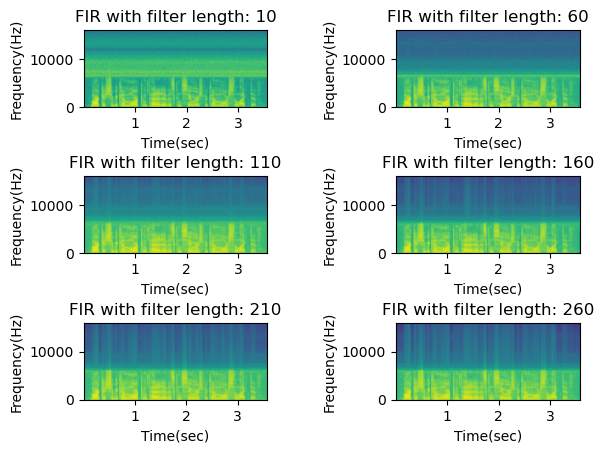

In [3]:
from scipy import signal
# Load the sound, play it, and plot it's spectrogram
sound,sample_rate = sf.read('case1.wav')
dft_size = 2**8  #256
hop_size = int(dft_size/4)
print("dft_size: {}, hop_size: {}".format(dft_size,hop_size))
window = np.hamming(dft_size)
sound_DFT = stft(sound, dft_size, hop_size, window)
sound_DFT_abs_log = get_log(sound_DFT)
plt.figure(figsize=(5,3))
title = "noise-corrupted speech signal"
plot_time_frequency(len(sound)/sample_rate,sample_rate,sound_DFT_abs_log.T,dft_size,title)
print("It can be seen from the spectrogram that some high frequence exits, so I'll use a low pass filter")
print("The cutoff frequency is around 6100Hz telling from the spectrogram")
# Design a filter that fixes things
cutoff_frequency = 6000
numtaps = 181
#FIR filter using scipy
FIR_bandreject_filter_using_scipy = signal.firwin(numtaps=numtaps, cutoff=cutoff_frequency, window = "hann", pass_zero='lowpass', fs=sample_rate)
#FIR filter with formulas
w = cutoff_frequency/(sample_rate/2)
n = np.array([i for i in range(-int((numtaps-1)/2),int((numtaps+1)/2))])
FIR_formula_lowpass = w*np.sinc(w*n)*signal.windows.hann(numtaps,sym=False)
#IIR Butterworth filter
b, a = signal.butter(10, cutoff_frequency-1000, 'lowpass', fs=sample_rate)
IIR_Butterworth_sound = signal.lfilter(b, a, sound)



# Show me the resulting spectrogram and sound
#FIR filter using scipy
plt.figure(figsize=(5,3))
title = "Case1: FIR filter using scipy"
FIR_bandreject_filter_using_scipy_sound = signal.convolve(sound, FIR_bandreject_filter_using_scipy)
play_sound(FIR_bandreject_filter_using_scipy_sound,sample_rate,title)
plot_specgram(FIR_bandreject_filter_using_scipy_sound,sample_rate,title)

#FIR filter using formula
plt.figure(figsize=(5,3))
title = "Case1: FIR filter using formula"
FIR_with_formula_sound = signal.convolve(sound,FIR_formula_lowpass)
play_sound(FIR_with_formula_sound,sample_rate,title)
plot_specgram(FIR_bandreject_filter_using_scipy_sound,sample_rate,title)

#Using IIR Butterworth filter
plt.figure(figsize=(5,3))
title = "Case1: IIR Butterworth filter"
play_sound(IIR_Butterworth_sound,sample_rate,title)
plot_specgram(IIR_Butterworth_sound,sample_rate,title)
# Repeat for cases 2, 3, and 4

#plot to compare the response of all filters.
plt.figure()
w, h = signal.freqz(b = FIR_bandreject_filter_using_scipy,fs = sample_rate)
plt.plot(w,abs(h),'r',label="FIR filter using scipy.signal.firwin()")
w, h = signal.freqz(b = FIR_formula_lowpass,fs = sample_rate)
plt.plot(w,abs(h),'b',label="FIR filter with formula")
w, h = signal.freqz(b,a,fs=sample_rate)
plt.plot(w,abs(h),'g',label="IIR Butterworth filter")
plt.xlabel("Frequency(Hz)")
plt.ylabel("Amplitude(dB)")
plt.title("the response of all filters")
plt.legend()

#The effect of different filter length for FIR filter
filter_lengthes = [10,60,110,160,210,260]
plt.figure()
rows = 3
columns = 2
fig, axes = plt.subplots(rows,columns, gridspec_kw={'hspace':0.9, 'wspace': 0.7})
for i in range(rows):
    for j in range(columns):
        numtaps = filter_lengthes[i*2+j]
        filter = signal.firwin(numtaps=numtaps, cutoff=cutoff_frequency, window = "hann", pass_zero='lowpass', fs=sample_rate)
        filtered_sound = signal.convolve(sound, filter)
        title = "FIR with filter length: {}".format(numtaps)
        axes[i][j].specgram(filtered_sound,Fs=sample_rate)
        axes[i][j].set_xlabel("Time(sec)")
        axes[i][j].set_ylabel("Frequency(Hz)")
        axes[i][j].set_title(title)

## Case: 2

dft_size: 256, hop_size: 64
It can be seen from the spectrogram that noise occurs in a certain frequency range.
So, I'll use a bandreject filter.


Case2: FIR filter using scipy


Case2: FIR filter using formula


Case2: IIR filter


FIR filter


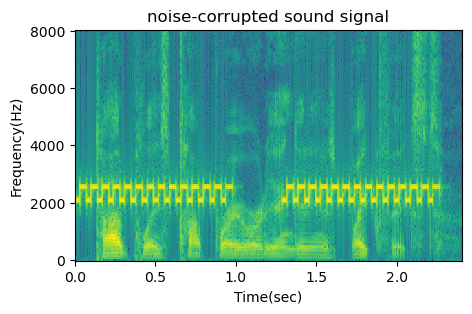

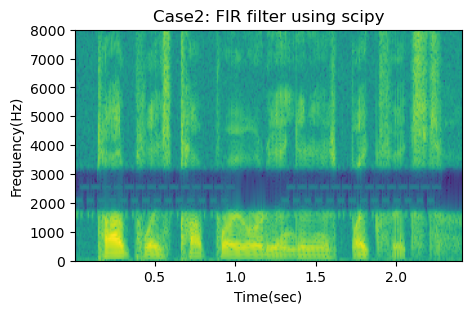

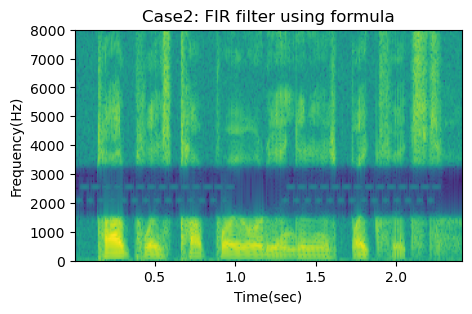

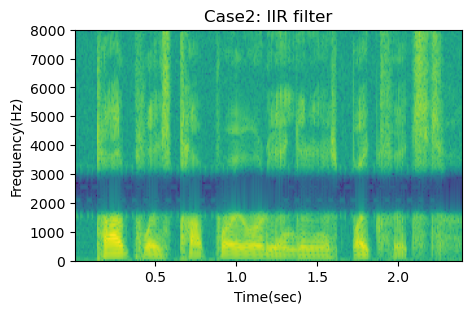

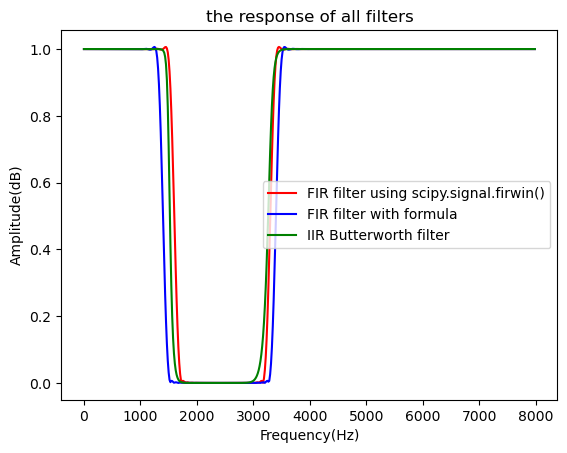

<Figure size 640x480 with 0 Axes>

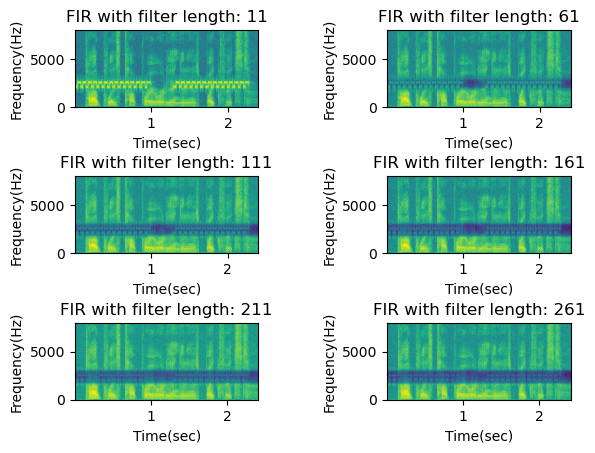

In [4]:
from scipy import signal
# Load the sound, play it, and plot it's spectrogram
sound,sample_rate = sf.read('case2.wav')
dft_size = 2**8  #256
hop_size = int(dft_size/4)
print("dft_size: {}, hop_size: {}".format(dft_size,hop_size))
window = np.hamming(dft_size)
sound_DFT = stft(sound, dft_size, hop_size, window)
sound_DFT_abs_log = get_log(sound_DFT)
plt.figure(figsize=(5,3))
title = "noise-corrupted sound signal"
plot_time_frequency(len(sound)/sample_rate,sample_rate,sound_DFT_abs_log.T,dft_size,title)
print("It can be seen from the spectrogram that noise occurs in a certain frequency range.")
print("So, I'll use a bandreject filter.")

# Design a filter that fixes things
cutoff_frequency = [1600, 3300]
numtaps = 211
#FIR filter using scipy
FIR_bandreject_filter_using_scipy = signal.firwin(numtaps=numtaps, cutoff=cutoff_frequency, window = "hann", pass_zero='bandstop', fs=sample_rate)
#FIR filter with formulas
cutoff_frequency = [1900, 2900]
center_frequency = sum(cutoff_frequency)/2/(sample_rate/2)
bandwidth = (cutoff_frequency[1]-cutoff_frequency[0])/(sample_rate/2)
n = np.array([i for i in range(-int((numtaps-1)/2),int((numtaps+1)/2))])
FIR_bandreject_filter_using_formula = -2*np.cos(np.pi*n*center_frequency)*bandwidth*np.sinc(bandwidth*n)
FIR_bandreject_filter_using_formula[int((numtaps-1)/2)] = 1-2*bandwidth*np.sinc(0)
FIR_bandreject_filter_using_formula *= signal.windows.hann(numtaps,sym=False)
#IIR filter
cutoff_frequency = [1500,3300]
b, a = signal.butter(15, cutoff_frequency, 'bandstop', fs=sample_rate)
IIR_bandreject_filter_sound = signal.lfilter(b, a, sound)



# Show me the resulting spectrogram and sound
#FIR filter using scipy
plt.figure(figsize=(5,3))
title = "Case2: FIR filter using scipy"
FIR_bandreject_filter_using_scipy_sound = signal.convolve(sound, FIR_bandreject_filter_using_scipy)
play_sound(FIR_bandreject_filter_using_scipy_sound,sample_rate,title)
plot_specgram(FIR_bandreject_filter_using_scipy_sound,sample_rate,title)

#FIR filter using formula
plt.figure(figsize=(5,3))
title = "Case2: FIR filter using formula"
FIR_bandreject_filter_using_formula_sound = signal.convolve(sound, FIR_bandreject_filter_using_formula)
play_sound(FIR_bandreject_filter_using_formula_sound,sample_rate,title)
plot_specgram(FIR_bandreject_filter_using_formula_sound,sample_rate,title)

##IIR filter
plt.figure(figsize=(5,3))
title = "Case2: IIR filter"
play_sound(IIR_bandreject_filter_sound,sample_rate,title)
plot_specgram(IIR_bandreject_filter_sound,sample_rate,title)

#plot to compare the response of all filters.
plt.figure()
w, h = signal.freqz(b = FIR_bandreject_filter_using_scipy,fs = sample_rate)
plt.plot(w,abs(h),'r',label="FIR filter using scipy.signal.firwin()")
w, h = signal.freqz(b = FIR_bandreject_filter_using_formula,fs = sample_rate)
plt.plot(w,abs(h),'b',label="FIR filter with formula")
w, h = signal.freqz(b,a,fs=sample_rate)
plt.plot(w,abs(h),'g',label="IIR Butterworth filter")
plt.xlabel("Frequency(Hz)")
plt.ylabel("Amplitude(dB)")
plt.title("the response of all filters")
plt.legend()

#The effect of different filter length for FIR filter
filter_lengthes = [11,61,111,161,211,261]
plt.figure()
rows = 3
columns = 2
cutoff_frequency = [1600, 3200]
fig, axes = plt.subplots(rows,columns, gridspec_kw={'hspace':0.9, 'wspace': 0.7})
print('FIR filter')
for i in range(rows):
    for j in range(columns):
        numtaps = filter_lengthes[i*2+j]
        filter = signal.firwin(numtaps=numtaps, cutoff=cutoff_frequency, window = "hann", pass_zero='bandstop', fs=sample_rate)
        filtered_sound = signal.convolve(sound, filter)
        title = "FIR with filter length: {}".format(numtaps)
        axes[i][j].specgram(filtered_sound,Fs=sample_rate)
        axes[i][j].set_xlabel("Time(sec)")
        axes[i][j].set_ylabel("Frequency(Hz)")
        axes[i][j].set_title(title)

## Case: 3

dft_size: 256, hop_size: 64


noise-corrupted sound signal


It can be seen from the spectrogram that noise occurs in lower frequency.
So, I'll use a highpass filter.


Case3: FIR filter using scipy


Case3: FIR filter using formula


Case3: IIR filter


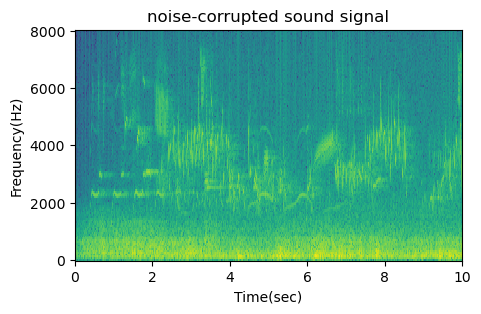

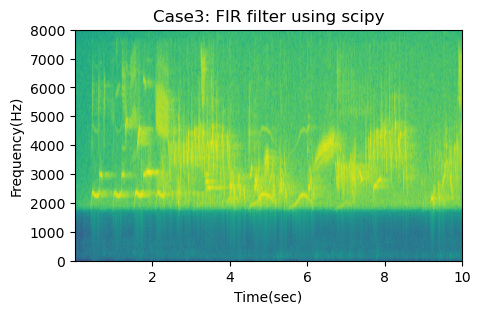

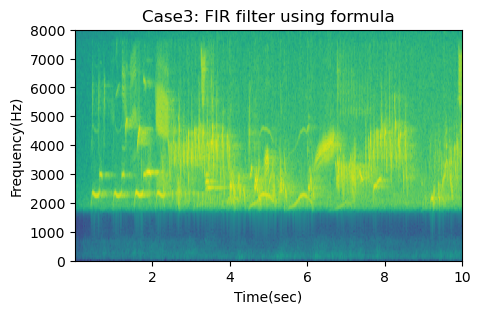

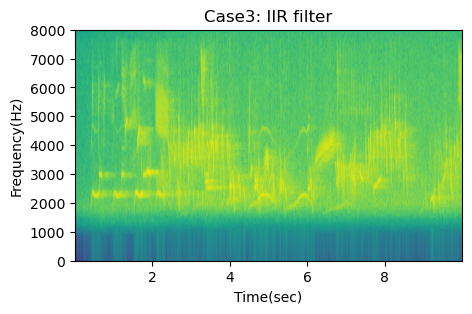

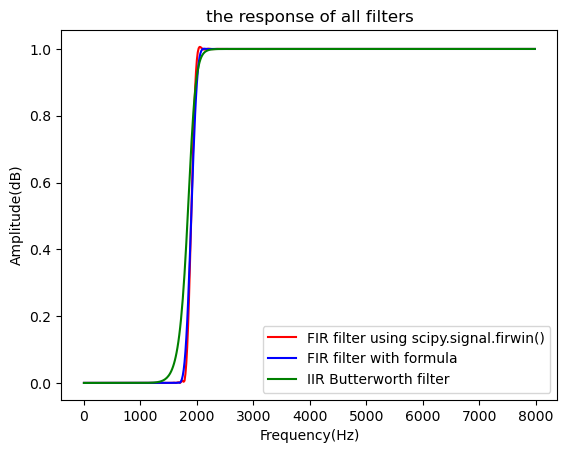

<Figure size 640x480 with 0 Axes>

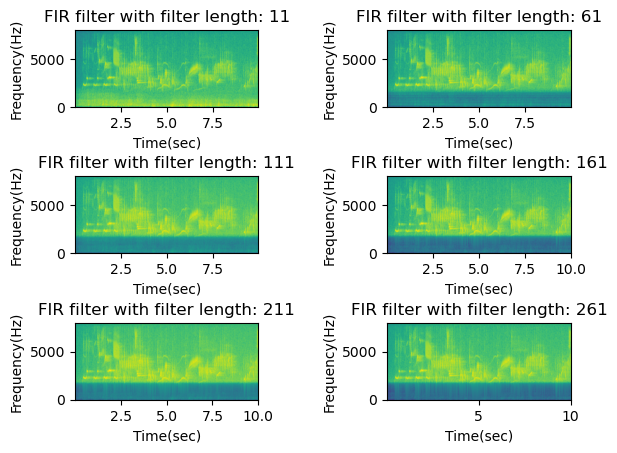

In [5]:
# Load the sound, play it, and plot it's spectrogram
sound,sample_rate = sf.read('case3.wav')
dft_size = 2**8  #256
hop_size = int(dft_size/4)
print("dft_size: {}, hop_size: {}".format(dft_size,hop_size))
window = np.hamming(dft_size)
sound_DFT = stft(sound, dft_size, hop_size, window)
sound_DFT_abs_log = get_log(sound_DFT)
plt.figure(figsize=(5,3))
title = "noise-corrupted sound signal"
play_sound(sound,sample_rate,title)
plot_time_frequency(len(sound)/sample_rate,sample_rate,sound_DFT_abs_log.T,dft_size,title)
print("It can be seen from the spectrogram that noise occurs in lower frequency.")
print("So, I'll use a highpass filter.")

# Design a filter that fixes things
cutoff_frequency = 1900
numtaps = 211
# FIR filter using scipy
FIR_bandreject_filter_using_scipy = signal.firwin(numtaps=numtaps, cutoff=cutoff_frequency, window = "hann", pass_zero='highpass', fs=sample_rate)
# FIR filter with formulas
w = cutoff_frequency/(sample_rate/2)
n = np.array([i for i in range(-int((numtaps-1)/2),int((numtaps+1)/2))])
FIR_formula_highpass = -w*np.sinc(w*n)*signal.windows.hann(numtaps,sym=False)
FIR_formula_highpass[int((numtaps-1)/2)] = 1 - w*np.sinc(0)
FIR_formula_highpass *= np.hanning(numtaps)
#IIR filter
b, a = signal.butter(15, cutoff_frequency, 'highpass', fs=sample_rate)
IIR_highpass_filter_sound = signal.lfilter(b, a, sound)

# Show me the resulting spectrogram and sound
#FIR filter using scipy
plt.figure(figsize=(5,3))
title = "Case3: FIR filter using scipy"
FIR_bandreject_filter_using_scipy_sound = signal.convolve(sound, FIR_bandreject_filter_using_scipy)
play_sound(FIR_bandreject_filter_using_scipy_sound,sample_rate,title)
plot_specgram(FIR_bandreject_filter_using_scipy_sound,sample_rate,title)

#FIR filter using formula
plt.figure(figsize=(5,3))
title = "Case3: FIR filter using formula"
FIR_highpass_filter_using_formula_sound = signal.convolve(sound, FIR_formula_highpass)
play_sound(FIR_highpass_filter_using_formula_sound,sample_rate,title)
plot_specgram(FIR_highpass_filter_using_formula_sound,sample_rate,title)

#IIR filter
plt.figure(figsize=(5,3))
title = "Case3: IIR filter"
play_sound(IIR_highpass_filter_sound,sample_rate,title)
plot_specgram(IIR_highpass_filter_sound,sample_rate,title)

#plot to compare the response of all filters.
plt.figure()
w, h = signal.freqz(b = FIR_bandreject_filter_using_scipy,fs = sample_rate)
plt.plot(w,abs(h),'r',label="FIR filter using scipy.signal.firwin()")
w, h = signal.freqz(b = FIR_formula_highpass,fs = sample_rate)
plt.plot(w,abs(h),'b',label="FIR filter with formula")
w, h = signal.freqz(b,a,fs=sample_rate)
plt.plot(w,abs(h),'g',label="IIR Butterworth filter")
plt.xlabel("Frequency(Hz)")
plt.ylabel("Amplitude(dB)")
plt.title("the response of all filters")
plt.legend()

#The effect of different filter length for FIR filter
filter_lengthes = [11,61,111,161,211,261]
plt.figure()
rows = 3
columns = 2
fig, axes = plt.subplots(rows,columns, gridspec_kw={'hspace':0.9, 'wspace': 0.7})
for i in range(rows):
    for j in range(columns):
        numtaps = filter_lengthes[i*2+j]
        filter = signal.firwin(numtaps=numtaps, cutoff=cutoff_frequency, window = "hann", pass_zero='highpass', fs=sample_rate)
        filtered_sound = signal.convolve(sound, filter)
        title = "FIR filter with filter length: {}".format(numtaps)
        axes[i][j].specgram(filtered_sound,Fs=sample_rate)
        axes[i][j].set_xlabel("Time(sec)")
        axes[i][j].set_ylabel("Frequency(Hz)")
        axes[i][j].set_title(title)

## Case: 4

dft_size: 256, hop_size: 64


noise-corrupted sound signal


It can be seen from the spectrogram that the sound we want is at certain frequency range
So, I'll use a bandpass filter.


Case4: FIR filter using scipy


Case4: FIR filter using formula


Case4: IIR filter


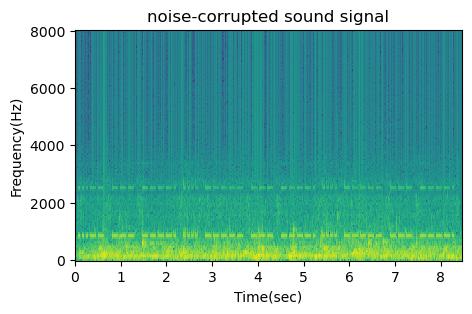

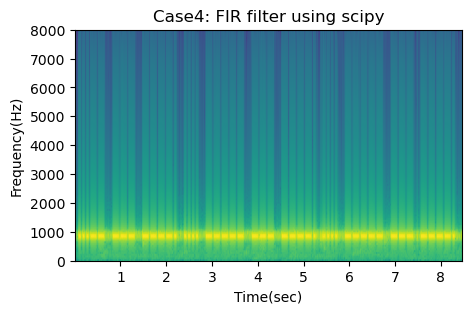

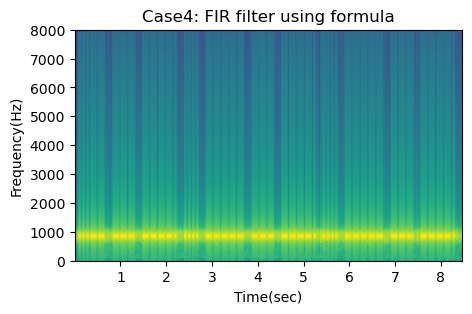

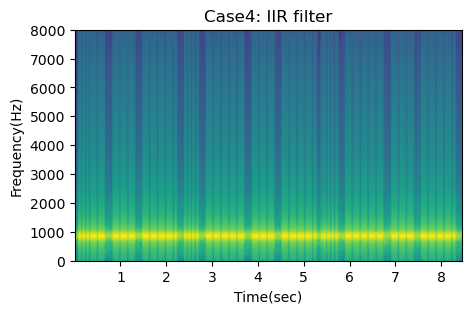

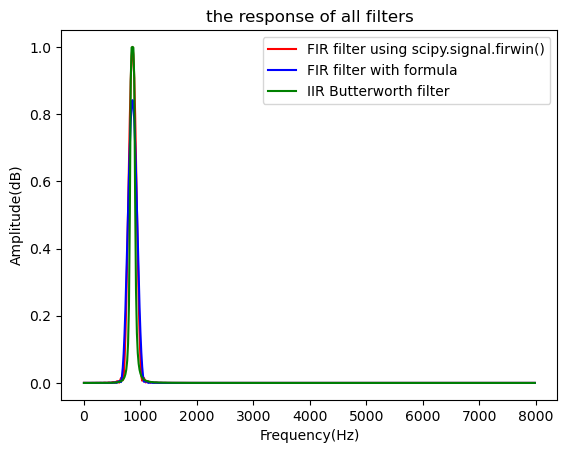

<Figure size 640x480 with 0 Axes>

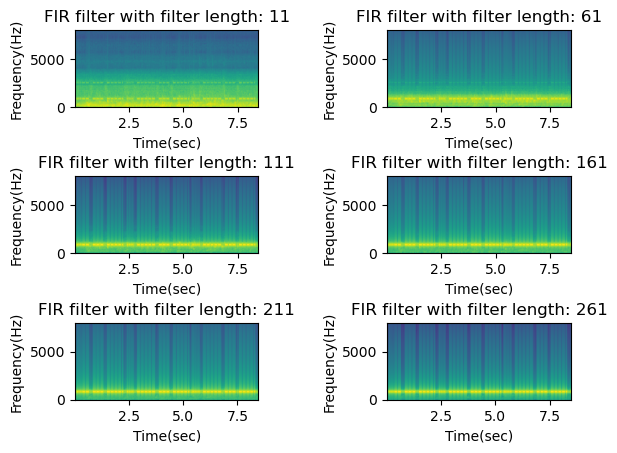

In [6]:
# Load the sound, play it, and plot it's spectrogram
sound,sample_rate = sf.read('case4.wav')
dft_size = 2**8  #256
hop_size = int(dft_size/4)
print("dft_size: {}, hop_size: {}".format(dft_size,hop_size))
window = np.hamming(dft_size)
sound_DFT = stft(sound, dft_size, hop_size, window)
sound_DFT_abs_log = get_log(sound_DFT)
plt.figure(figsize=(5,3))
title = "noise-corrupted sound signal"
play_sound(sound,sample_rate,title)
plot_time_frequency(len(sound)/sample_rate,sample_rate,sound_DFT_abs_log.T,dft_size,title)
print("It can be seen from the spectrogram that the sound we want is at certain frequency range")
print("So, I'll use a bandpass filter.")

# Design a filter that fixes things
cutoff_frequency = [820,900]
numtaps = 211
# FIR filter using scipy
FIR_bandreject_filter_using_scipy = signal.firwin(numtaps=numtaps, cutoff=cutoff_frequency, window = "hann", pass_zero='bandpass', fs=sample_rate)
# FIR filter with formulas
center_frequency = sum(cutoff_frequency)/2/(sample_rate/2)
bandwidth = (cutoff_frequency[1]-cutoff_frequency[0])/(sample_rate/2)
n = np.array([i for i in range(-int((numtaps-1)/2),int((numtaps+1)/2))])
FIR_bandpass_filter_using_formula = 2*np.cos(np.pi*n*center_frequency)*bandwidth*np.sinc(bandwidth*n)
FIR_bandpass_filter_using_formula *= signal.windows.hann(numtaps,sym=False)
#IIR filter
#cutoff_frequency = [800, 900]
b, a = signal.butter(3, cutoff_frequency, 'bandpass', fs=sample_rate)
IIR_bandpass_filter_sound = signal.lfilter(b, a, sound)

# Show me the resulting spectrogram and sound
#FIR filter using scipy
plt.figure(figsize=(5,3))
title = "Case4: FIR filter using scipy"
FIR_bandreject_filter_using_scipy_sound = signal.convolve(sound, FIR_bandreject_filter_using_scipy)
play_sound(FIR_bandreject_filter_using_scipy_sound,sample_rate,title)
plot_specgram(FIR_bandreject_filter_using_scipy_sound,sample_rate,title)

#FIR filter using formula
plt.figure(figsize=(5,3))
title = "Case4: FIR filter using formula"
FIR_bandpass_filter_using_formula_sound = signal.convolve(sound, FIR_bandpass_filter_using_formula)
play_sound(FIR_bandpass_filter_using_formula_sound,sample_rate,title)
plot_specgram(FIR_bandpass_filter_using_formula_sound,sample_rate,title)

#IIR filter
plt.figure(figsize=(5,3))
title = "Case4: IIR filter"
play_sound(IIR_bandpass_filter_sound,sample_rate,title)
plot_specgram(IIR_bandpass_filter_sound,sample_rate,title)

#plot to compare the response of all filters.
plt.figure()
w, h = signal.freqz(b = FIR_bandreject_filter_using_scipy,fs = sample_rate)
plt.plot(w,abs(h),'r',label="FIR filter using scipy.signal.firwin()")
w, h = signal.freqz(b = FIR_bandpass_filter_using_formula,fs = sample_rate)
plt.plot(w,abs(h),'b',label="FIR filter with formula")
w, h = signal.freqz(b,a,fs=sample_rate)
plt.plot(w,abs(h),'g',label="IIR Butterworth filter")
plt.xlabel("Frequency(Hz)")
plt.ylabel("Amplitude(dB)")
plt.title("the response of all filters")
plt.legend()

#The effect of different filter length for FIR filter
filter_lengthes = [11,61,111,161,211,261]
plt.figure()
rows = 3
columns = 2
fig, axes = plt.subplots(rows,columns, gridspec_kw={'hspace':0.9, 'wspace': 0.7})
for i in range(rows):
    for j in range(columns):
        numtaps = filter_lengthes[i*2+j]
        filter = signal.firwin(numtaps=numtaps, cutoff=cutoff_frequency, window = "hann", pass_zero='bandpass', fs=sample_rate)
        filtered_sound = signal.convolve(sound, filter)
        title = "FIR filter with filter length: {}".format(numtaps)
        axes[i][j].specgram(filtered_sound,Fs=sample_rate)
        axes[i][j].set_xlabel("Time(sec)")
        axes[i][j].set_ylabel("Frequency(Hz)")
        axes[i][j].set_title(title)

## Part 2. Designing a simple equalizer

For this part we will design a simple graphic equalizer. We will do so using a more straightforward approach as opposed to a bank of filters as discussed in class.

We want to make an equalizer which contains six bands with center frequencies at 100Hz, 200Hz, 400Hz, 800Hz, 1600Hz and 3200Hz. Your equalizer function will take two inputs, one for the input sound and a 6-element gain vector that will indicate how much to boost or suppress each frequency band. Use the ```scipy.signal.firwin2``` function to design a filter that has the desired characteristics. For various settings of the gain vector, use the ```scipy.signal.freqz``` command to plot the response of the filter and verify that it behaves as indicated. Experiment with various filter lengths and see which works best.

Once you figure that out, design a graphic equalizer with as many bands as you like (and arbitrary center frequencies as well), and use it to solve the problems in part 1 again. The only thing that should be different in the EQ for each recording should be the gains for each band. Play the output sounds, and show the spectrograms, see how they compare with your previous solutions.

Optional extra credit (+1pt): Use ipywidgets to make interactive sliders and process an audio stream and play it from the speakers in real-time (either from mic input, or just stream audio from disk).

case1: Filtered sound using equalizer


case2: Filtered sound using equalizer


case3: Filtered sound using equalizer


case4: Filtered sound using equalizer


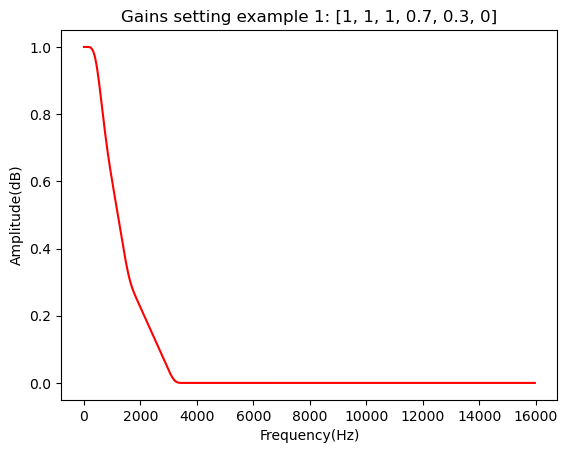

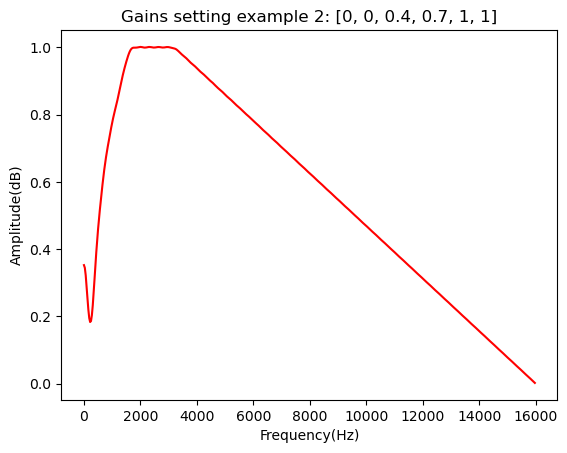

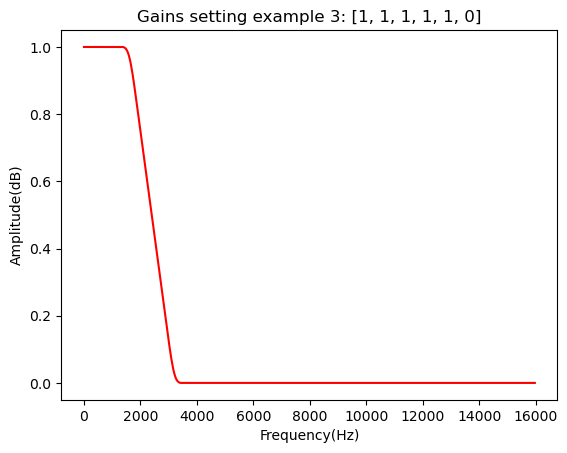

<Figure size 640x480 with 0 Axes>

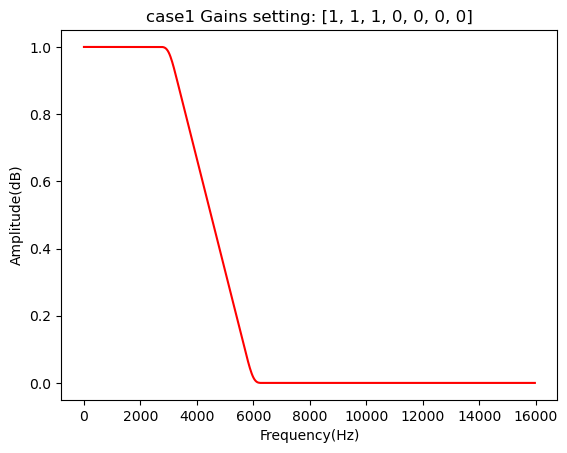

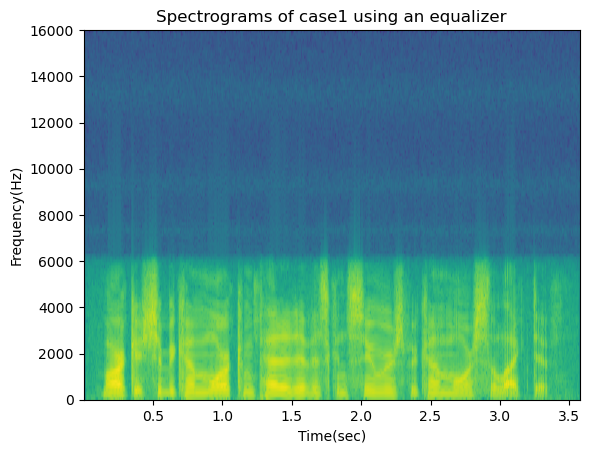

<Figure size 640x480 with 0 Axes>

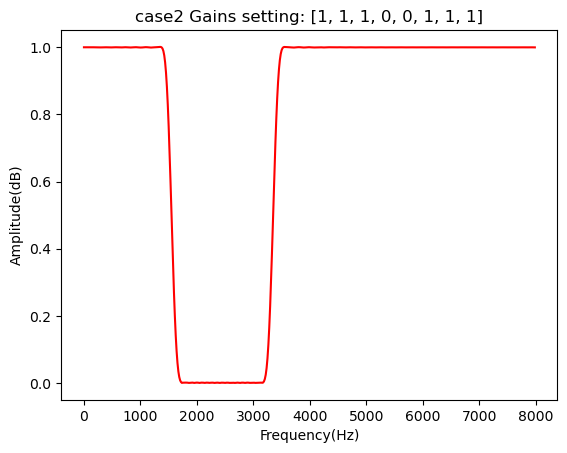

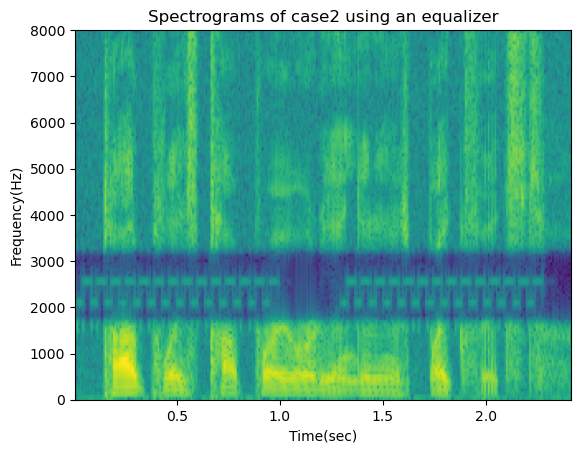

<Figure size 640x480 with 0 Axes>

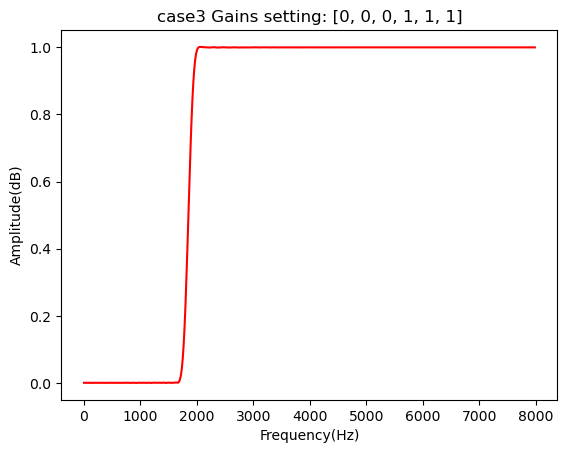

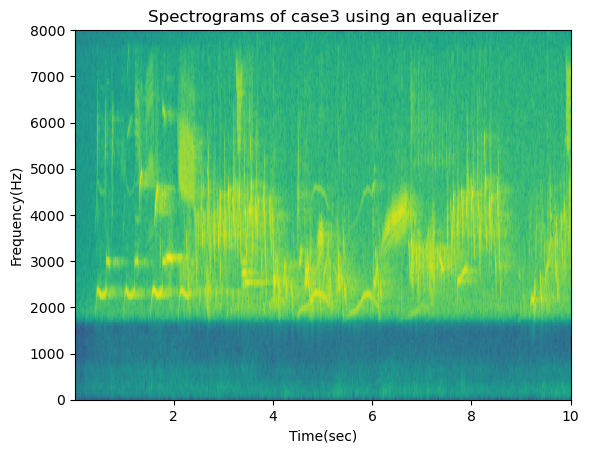

<Figure size 640x480 with 0 Axes>

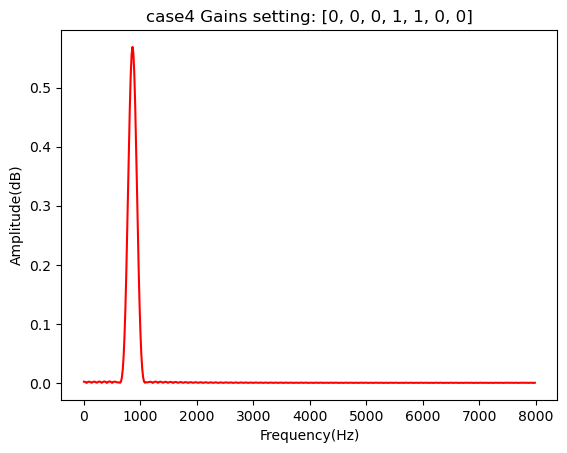

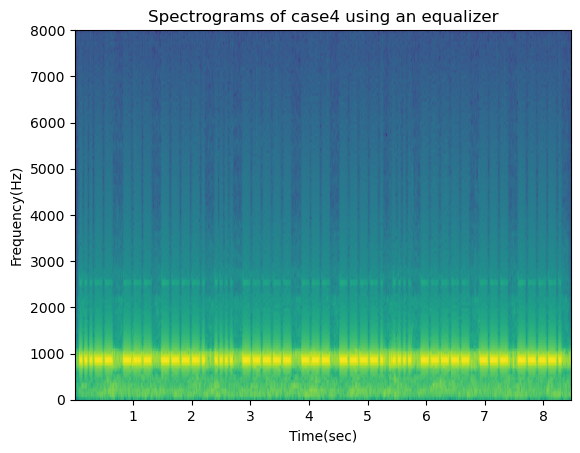

In [8]:
example_sound,sample_rate = sf.read('case1.wav')
# Design an equalizer function
def equalizer( input_sound, gains):
    numtaps = 200
    bands = [100, 200, 400, 800, 1600, 3200]
    gains = [1]+gains+[0]
    equal = signal.firwin2(numtaps, [0]+bands+[sample_rate/2], gains, nyq=sample_rate/2)
    return (equal,signal.convolve(input_sound, equal))

def equalizer_any_bands(bands, gains, sample_rate):
    numtaps = 181
    equal = signal.firwin2(numtaps, bands, gains, nyq=sample_rate/2)
    return equal
def plot_response(filter, sample_rate,gain,case):
    plt.figure()
    w, h = signal.freqz(b = filter,fs = sample_rate)
    plt.plot(w,abs(h),'r')
    plt.xlabel("Frequency(Hz)")
    plt.ylabel("Amplitude(dB)")
    plt.title(case+" "+"Gains setting: {}".format(gain))


# Show its response with various gain settings
gains = [[1,1,1,0.7,0.3,0],
         [0,0,0.4,0.7,1,1],
         [1,1,1,1,1,0]]

for i in range(len(gains)):
    equal, equalized_sound = equalizer(example_sound,gains[i])
    plt.figure()
    w, h = signal.freqz(b = equal,fs = sample_rate)
    plt.plot(w,abs(h),'r')
    plt.xlabel("Frequency(Hz)")
    plt.ylabel("Amplitude(dB)")
    plt.title("Gains setting example {}: {}".format(i+1,gains[i]))


# Show how it can denoise the examples in part 1
#Case 1
def filter_sound(case,band,gain,first_gain,last_gain):
    case1_sound,sample_rate = sf.read('{}.wav'.format(case))
    band = [0]+ band+[sample_rate/2]
    gain = [first_gain]+gain+[last_gain]
    equalizer1 = equalizer_any_bands(band,gain,sample_rate)
    plt.figure()
    plot_response(equalizer1, sample_rate,gain,case)
    case1_filted_sound = signal.convolve(case1_sound,equalizer1)
    title = "Spectrograms of {} using an equalizer".format(case)
    plt.figure()
    plot_specgram(case1_filted_sound, sample_rate,title)
    play_sound(case1_filted_sound, sample_rate,"{}: Filtered sound using equalizer".format(case))

#case 1
band = [1000,3000,6000,6500,7000]
gain = [1,1,0,0,0]
filter_sound("case1",band,gain,1,0)

#case 2
band = [1000,1500,1600,3300,3400,7900]
gain = [1,1,0,0,1,1]
filter_sound("case2",band,gain,1,1)

#case 3
band = [1000,1800,1900,2400]
gain = [0,0,1,1]
filter_sound("case3",band,gain,0,1)

#case 4
band = [400,800,820,900,920]
gain = [0,0,1,1,0]
filter_sound("case4",band,gain,0,0)


## Interactive Sliders

In [9]:
import ipywidgets
def interactive_sliders(gain1,gain2,gain3,gain4,gain5,gain6,gain7,gain8,gain9,gain10):
    gain = [gain1,gain2,gain3,gain4,gain5,gain6,gain7,gain8,gain9,gain10]
    brands = [100,500,1000,2000,3000,4000,5000,6000,7000,8000]
    case = "case1"
    filter_sound(case,brands,gain,1,0)
ipywidgets.interact(interactive_sliders,
    gain1 = ipywidgets.FloatSlider(value=1,min=0,max=1,step=0.1,description='100Hz',orientation='horizontal'),
    gain2 = ipywidgets.FloatSlider(value=1,min=0,max=1,step=0.1,description='500Hz',orientation='horizontal'),
    gain3 = ipywidgets.FloatSlider(value=1,min=0,max=1,step=0.1,description='1000Hz',orientation='horizontal'),
    gain4 = ipywidgets.FloatSlider(value=1,min=0,max=1,step=0.1,description='2000Hz',orientation='horizontal'),
    gain5 = ipywidgets.FloatSlider(value=1,min=0,max=1,step=0.1,description='3000Hz',orientation='horizontal'),
    gain6 = ipywidgets.FloatSlider(value=1,min=0,max=1,step=0.1,description='4000Hz',orientation='horizontal'),
    gain7 = ipywidgets.FloatSlider(value=1,min=0,max=1,step=0.1,description='5000Hz',orientation='horizontal'),
    gain8 = ipywidgets.FloatSlider(value=1,min=0,max=1,step=0.1,description='6000Hz',orientation='horizontal'),
    gain9 = ipywidgets.FloatSlider(value=1,min=0,max=1,step=0.1,description='7000Hz',orientation='horizontal'),
    gain10 = ipywidgets.FloatSlider(value=1,min=0,max=1,step=0.1,description='8000Hz',orientation='horizontal')
)

interactive(children=(FloatSlider(value=1.0, description='100Hz', max=1.0), FloatSlider(value=1.0, description…

<function __main__.interactive_sliders(gain1, gain2, gain3, gain4, gain5, gain6, gain7, gain8, gain9, gain10)>

I put pictures of the interactive sliders here. You probably need to run the code to get the real interactive sliders.
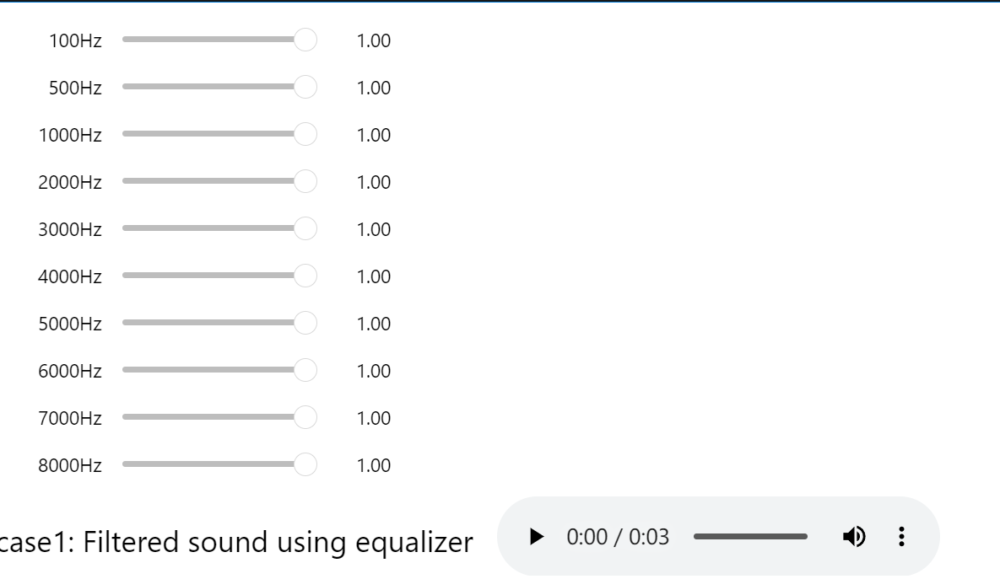
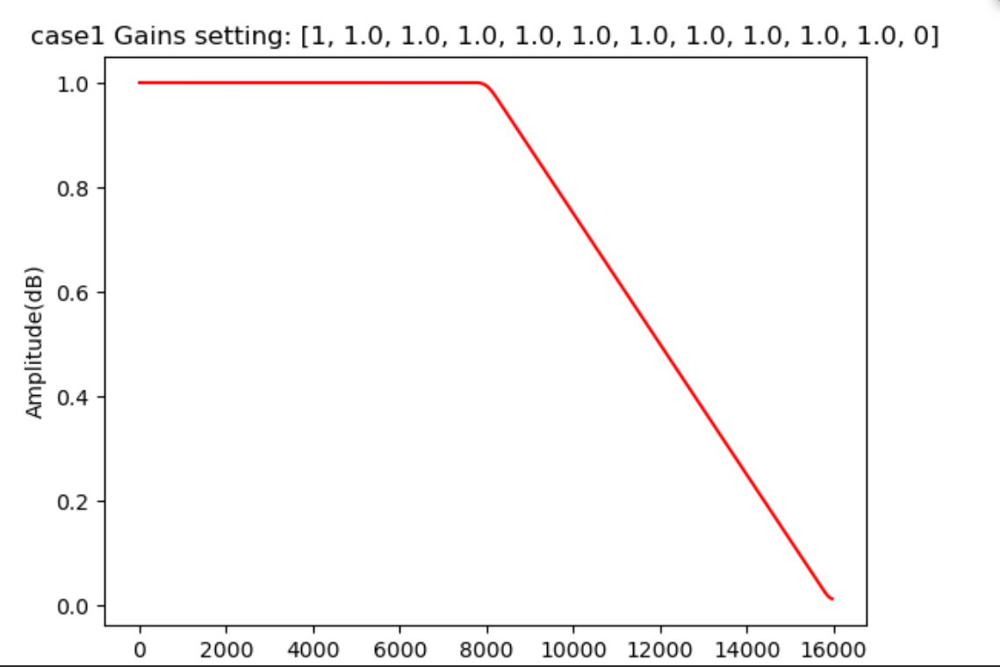
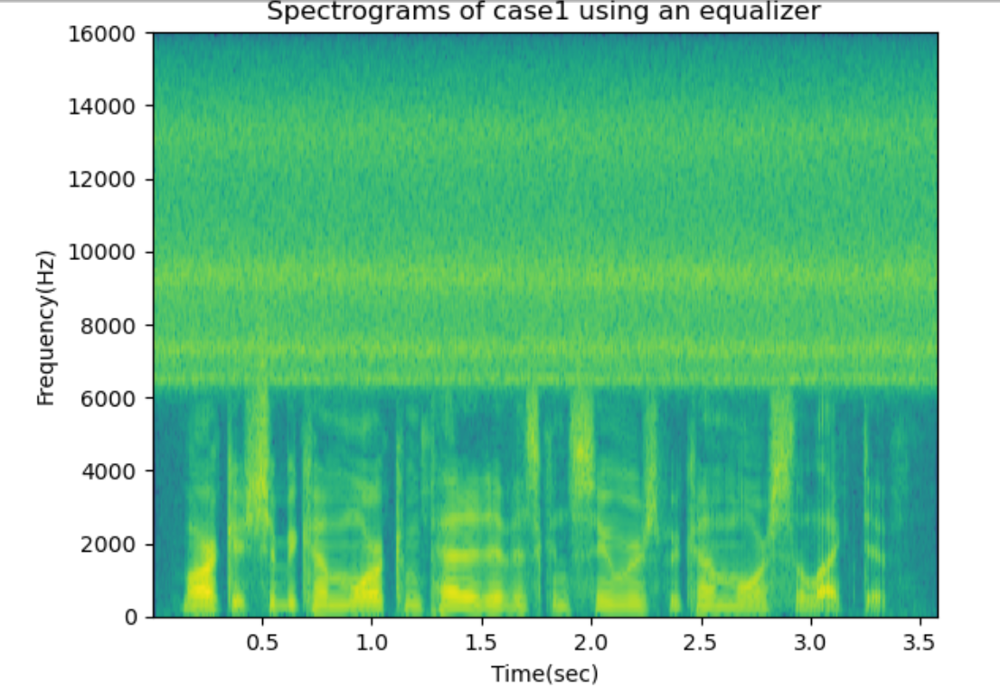

## Part 3: Say Ahhh ...

Let's make the computer talk.  To do so we need two things, an excitation signal and a filter.  For the excitation we will use something called the "Rosenberg Pulse".  A simple version of it will be the same as a cosine, but it will only be non-zero between phases $3\pi/2$ and $2\pi$.  It will effectively look like a curvy ramp from zero to one that takes place during the last quarter of each period.  Using it, generate a 0.3 sec signal with a frequency of 100Hz, at a sampling rate of 8kHz.  It should sound like a short buzzy tone.

Posenberg Pulse


Text(0.5, 1.0, 'Posenberg Pulse')

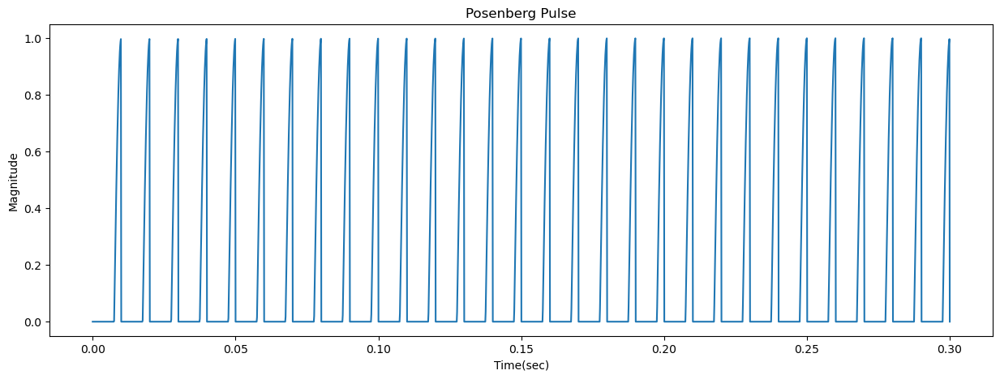

In [82]:
# Make Posenberg Pulse
def make_posenberg_pulse( frequency=440, duration=1, sample_rate=8000):
    t = np.linspace(0, duration, num=int(sample_rate*duration))
    sound = np.zeros(len(t))
    for i in range(len(t)):
        angle = (2*np.pi*frequency*t[i]) % (2*np.pi)
        if angle >= 1.5*np.pi and angle <=2*np.pi:
             sound[i] = np.cos(angle)
    return sound
frequency = 100
duration = 0.3
sample_rate = 8000
posenberg_pulse_sound = make_posenberg_pulse(frequency, duration, sample_rate)
play_sound(posenberg_pulse_sound,sample_rate,"Posenberg Pulse")

#plot the wavet
time_axis = np.linspace(0, duration, num=int(sample_rate*duration))
plt.figure(figsize=(15,5))
plt.plot(time_axis,posenberg_pulse_sound)
plt.xlabel("Time(sec)")
plt.ylabel("Magnitude")
plt.title('Posenberg Pulse')

Now that you have a glottal pulse, let's apply some filters to generate two vowels, "a" and "u".  In the code snippet below I have two tables that hold the center frequency and amplitude of the five resonances that make each vowel.  To model these resonances, design a bandpass filter with a bandwidth of 90Hz centered at each of the given frequencies.  You will end up with five filters for each vowel.  Then take the pulse sound from above and convolve it with the five filters of each vowel (in parallel, not in series) and add the outputs together and scale them with their corresponding amplitudes in the given tables.  Play the results and verify that they sound like an "a" and an "u".

To design the filters, use the ```scipy.signal.firwin``` function with filters of length 61.

In [93]:
# Formant table for "a"
Fa = [
    [600, 1040, 2250, 2450, 2750], # Formant frequencies in Hz
    [1,     .7,   .6,   .5,   .3], # Formant amplitudes
]

# Formant table for "u"
Fu = [
    [400, 600, 2400, 2675, 2950], # Formant frequencies in Hz
    [1,    .7,   .6,   .5,   .3], # Formant amplitudes
]

# generate five bandpass filters
filter_length = 61
def generate_filters(frequencies,sample_rate):
    filters = []
    
    bandwidth = 90
    for frequency in frequencies:
        filter = signal.firwin(numtaps=filter_length, cutoff=[frequency-bandwidth/2, frequency+bandwidth/2], pass_zero='bandpass', fs=sample_rate)
        filters.append(filter)
    return filters
#  "a"
a_sound = np.zeros(len(posenberg_pulse_sound)+filter_length-1)
a_filters = generate_filters(Fa[0],sample_rate)
for i in range(len(a_filters)):
    filter = a_filters[i]
    convolved_sound = signal.convolve(posenberg_pulse_sound,filter)
    a_sound += convolved_sound*Fa[1][i]
play_sound(a_sound,rate=sample_rate,label="Vowel a")

# "u"
u_sound = np.zeros(len(posenberg_pulse_sound)+filter_length-1)
u_filters = generate_filters(Fu[0],sample_rate)
for i in range(len(u_filters)):
    filter = u_filters[i]
    convolved_sound = signal.convolve(posenberg_pulse_sound,filter)
    u_sound += convolved_sound*Fu[1][i]
play_sound(u_sound,rate=sample_rate,label="Vowel u")

Vowel a


Vowel u


Now let's try to compose a word by combining the vowels.  Concatenate the two sounds above and play the result to form the word "ow".  It will not sound great because the transition from one to the other is too abrupt.  To make this a little better, we will need to crossfade the two sounds (just as you have already done for lab 0, part 3).  To do so, use a 100ms linear crossfade between the two sounds.  Play the result and verify that it sounds better.

In [99]:
crossfade_time = 0.1
crossfade_points = int(crossfade_time*sample_rate)
fade = np.linspace(0,1,crossfade_points)
for i in range(crossfade_points):
    a_sound[-(i+1)] *=  fade[i]
    u_sound[i] *= fade[i]
overlap = a_sound[(len(a_sound)-crossfade_points):]+u_sound[:crossfade_points]
word_sound = np.concatenate((a_sound[:(len(a_sound)-crossfade_points)], overlap, u_sound[(crossfade_points):]))
play_sound(word_sound,sample_rate,"ow")

ow


Congrats, you just made your computer talk!  For an early example of this type of speech generation, check out the "Daisy, Daisy" song as rendered by a computer in 1961.  [https://www.youtube.com/watch?v=41U78QP8nBk](https://www.youtube.com/watch?v=41U78QP8nBk)  This was the first instance of a computer singing, and a precursor to models like Vocaloid (which are of course a lot better!).  If you are into sci-fi, you might also remember HAL 9000 singing this song in 2001: A Space Odyssey.  It was a nod to this early achievement in computer speech synthesis.
